In [1]:
import pandas as pd

from classification_evaluator import ClassificationEvaluator
from multi_classification_evaluator import MultiClassificationEvaluator

from IPython.display import Markdown, display
import warnings

warnings.filterwarnings("ignore")

## GitHub Stargazers - SNAP: Network dataset (binary classification)

In [2]:
gs_results = pd.read_csv("../datasets/github_stargazers/results.csv")

In [3]:
gs_evaluator = ClassificationEvaluator(predictions=gs_results)
gs_eval_df = gs_evaluator.calculate_classification_metrics(
    if_return_melted_not_pivoted=False
)
display(Markdown("All results"), gs_eval_df)

# find top specification for each method
tmp = gs_eval_df.merge(
    gs_eval_df["method"]
    .str.rsplit("_", 1, expand=True)
    .rename(columns={0: "method_name", 1: "params"}),
    left_index=True,
    right_index=True,
)
idx = tmp.groupby(["method_name"])["AUC"].transform(max) == tmp["AUC"]
best = tmp.loc[idx][gs_eval_df.columns]

display(Markdown("Top methods: "), list(best["method"]))

All results

,method,accuracy,f1,precision,recall,AUC
0,pagerank_w_mean_0.00,0.602672,0.697825,0.588271,0.857521,0.627882
1,pagerank_w_mean_0.10,0.606287,0.700144,0.590808,0.859136,0.630543
2,pagerank_w_mean_0.20,0.611159,0.701568,0.595170,0.854289,0.634998
3,pagerank_w_mean_0.30,0.612024,0.699751,0.597094,0.845035,0.639180
4,pagerank_w_mean_0.40,0.611552,0.695234,0.599086,0.828143,0.643777
...,...,...,...,...,...,...
70,current_flow_closeness_centrality_w_proj_0.60,0.628291,0.694681,0.619645,0.790394,0.663910
71,current_flow_closeness_centrality_w_proj_0.70,0.626640,0.693464,0.618341,0.789365,0.661586
72,current_flow_closeness_centrality_w_proj_0.80,0.623497,0.690324,0.616415,0.784371,0.659772
73,current_flow_closeness_centrality_w_proj_0.90,0.624912,0.689763,0.618631,0.779377,0.659269


Top methods: 

['pagerank_w_mean_0.70',
 'pagerank_concat',
 'pagerank_p_proj_True',
 'pagerank_w_proj_0.40',
 'closeness_centrality_w_mean_0.60',
 'closeness_centrality_concat',
 'closeness_centrality_p_proj_True',
 'closeness_centrality_w_proj_0.40',
 'current_flow_closeness_centrality_w_mean_0.60',
 'current_flow_closeness_centrality_concat',
 'current_flow_closeness_centrality_p_proj_True',
 'current_flow_closeness_centrality_w_proj_0.40']

In [4]:
# initialize the 2nd. evaluator to plot results for top methods only
gs_results_best = gs_results.loc[gs_results["method"].isin(best["method"])]
gs_results_best["method"] = gs_results_best["method"].str.rsplit("_", 1, expand=True)[0]

gs_evaluator_best = ClassificationEvaluator(predictions=gs_results_best)

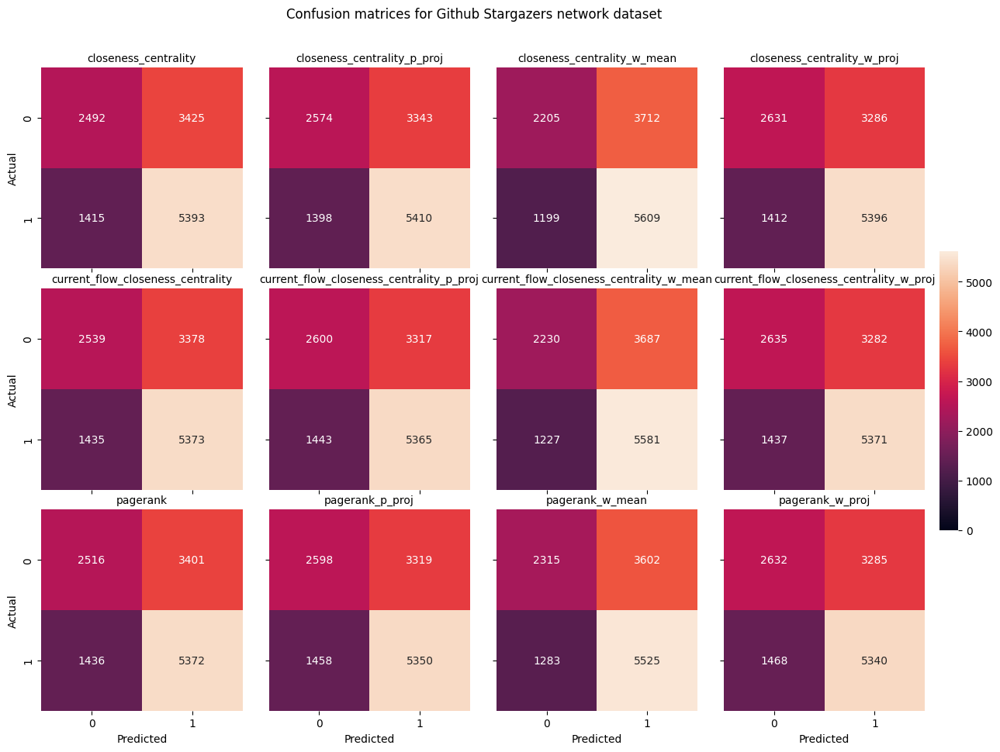

In [5]:
gs_evaluator_best.plot_confusion_matrices_grid(
    plot_title="Confusion matrices for Github Stargazers network dataset",
    cols_number_on_plot=4,
)

In [6]:
gs_evaluator_best.plot_roc_curves(
    plot_title="ROC curves for Github Stargazers network dataset",
    width=1000,
    height=600,
)

In [7]:
gs_evaluator_best.plot_precision_recall(width=1000, height=600)

## Random Partition Graphs - synthetic dataset

In [8]:
rpg_results = pd.read_csv("../datasets/partition_graphs/results.csv",index_col=0)

rpg_results["probability_prediction"] = (
    rpg_results[
        [
            "probability_prediction_0",
            "probability_prediction_1",
            "probability_prediction_2",
        ]
    ]
    .to_numpy()
    .tolist()
)

In [9]:
rpg_evaluator = MultiClassificationEvaluator(predictions=rpg_results)
rpg_eval_df = rpg_evaluator.calculate_classification_metrics(
    if_return_melted_not_pivoted=False
)
display(Markdown("All results"), rpg_eval_df)

# find top specification for each method
tmp = rpg_eval_df.merge(
    rpg_eval_df["method"]
    .str.rsplit("_", 1, expand=True)
    .rename(columns={0: "method_name", 1: "params"}),
    left_index=True,
    right_index=True,
)
idx = tmp.groupby(["method_name"])["macro_AUC"].transform(max) == tmp["macro_AUC"]
best = tmp.loc[idx][rpg_eval_df.columns]

display(Markdown("Top methods: "), list(best["method"]))

All results

,method,accuracy,macro_f1,macro_precision,macro_recall,macro_AUC
0,pagerank_w_mean_0.00,0.725556,0.504902,0.483519,0.534286,0.826589
1,pagerank_w_mean_0.10,0.713333,0.495509,0.477292,0.524021,0.810971
2,pagerank_w_mean_0.20,0.700000,0.484466,0.471588,0.512169,0.793200
3,pagerank_w_mean_0.30,0.684444,0.471217,0.463768,0.498624,0.771099
4,pagerank_w_mean_0.40,0.660000,0.451565,0.447754,0.478942,0.745766
...,...,...,...,...,...,...
70,current_flow_closeness_centrality_w_proj_0.60,0.632222,0.432483,0.423199,0.459365,0.694364
71,current_flow_closeness_centrality_w_proj_0.70,0.604444,0.407179,0.406069,0.435344,0.671641
72,current_flow_closeness_centrality_w_proj_0.80,0.566667,0.368900,0.379576,0.402328,0.652165
73,current_flow_closeness_centrality_w_proj_0.90,0.560000,0.357115,0.381152,0.394709,0.636819


Top methods: 

['pagerank_w_mean_0.00',
 'pagerank_concat',
 'pagerank_p_proj_True',
 'pagerank_w_proj_0.00',
 'closeness_centrality_w_mean_0.00',
 'closeness_centrality_concat',
 'closeness_centrality_p_proj_True',
 'closeness_centrality_w_proj_0.00',
 'current_flow_closeness_centrality_w_mean_0.00',
 'current_flow_closeness_centrality_concat',
 'current_flow_closeness_centrality_p_proj_True',
 'current_flow_closeness_centrality_w_proj_0.00']

In [10]:
# initialize the 2nd. evaluator to plot results for top methods only
rpg_results_best = rpg_results.loc[rpg_results["method"].isin(best["method"])]
rpg_results_best["method"] = rpg_results_best["method"].str.rsplit("_", 1, expand=True)[
    0
]

rpg_evaluator_best = MultiClassificationEvaluator(predictions=rpg_results_best)

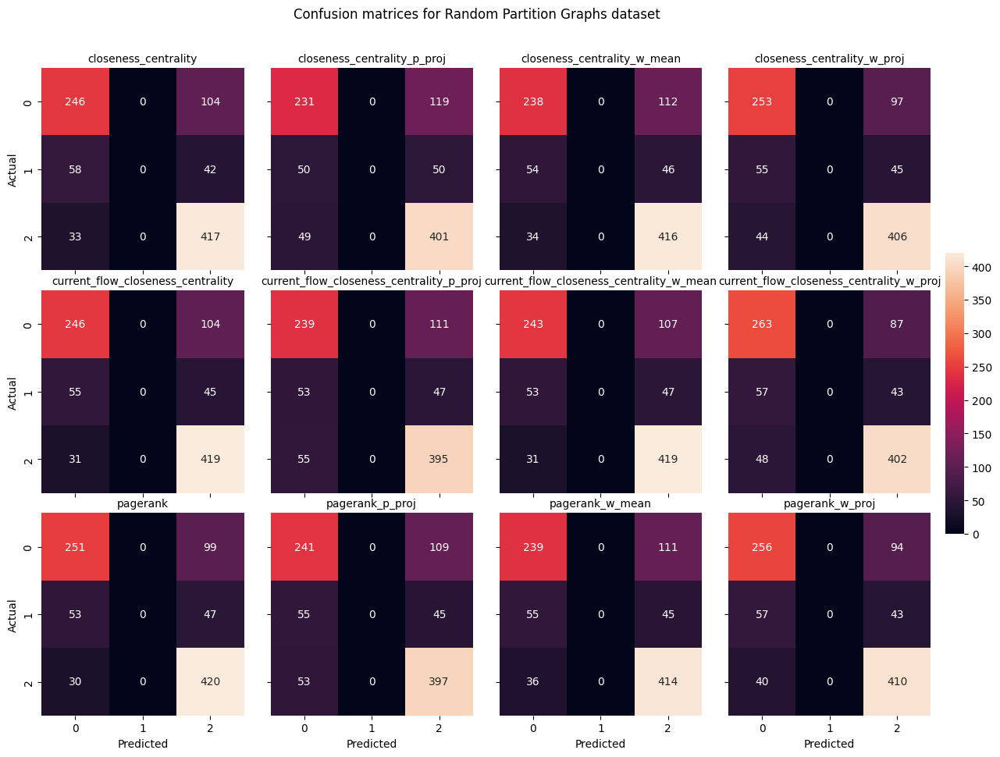

In [11]:
rpg_evaluator_best.plot_confusion_matrices_grid(
    plot_title="Confusion matrices for Random Partition Graphs dataset",
    cols_number_on_plot=4,
)

In [12]:
rpg_evaluator_best.plot_roc_curves(
    width=900,
    height=600,
)

In [13]:
rpg_evaluator_best.plot_precision_recall(width=800, height=600)

## Random Regular Graphs - synthetic dataset

In [14]:
rrg_results = pd.read_csv("../datasets/regular_graphs/results.csv")

rrg_results["probability_prediction"] = (
    rrg_results[
        [
            "probability_prediction_0",
            "probability_prediction_1",
            "probability_prediction_2",
        ]
    ]
    .to_numpy()
    .tolist()
)

In [15]:
rrg_evaluator = MultiClassificationEvaluator(predictions=rrg_results)
rrg_eval_df = rrg_evaluator.calculate_classification_metrics(
    if_return_melted_not_pivoted=False
)
display(Markdown("All results"), rrg_eval_df)

# find top specification for each method
tmp = rrg_eval_df.merge(
    rrg_eval_df["method"]
    .str.rsplit("_", 1, expand=True)
    .rename(columns={0: "method_name", 1: "params"}),
    left_index=True,
    right_index=True,
)
idx = tmp.groupby(["method_name"])["macro_AUC"].transform(max) == tmp["macro_AUC"]
best = tmp.loc[idx][rrg_eval_df.columns]

display(Markdown("Top methods: "), list(best["method"]))

All results

,method,accuracy,macro_f1,macro_precision,macro_recall,macro_AUC
0,pagerank_w_mean_0.00,0.433684,0.295271,0.541341,0.374374,0.592769
1,pagerank_w_mean_0.10,0.437895,0.394700,0.420408,0.407348,0.645531
2,pagerank_w_mean_0.20,0.501053,0.474498,0.493387,0.472204,0.700907
3,pagerank_w_mean_0.30,0.564211,0.541437,0.569740,0.533235,0.758414
4,pagerank_w_mean_0.40,0.618947,0.601818,0.626016,0.591867,0.812066
...,...,...,...,...,...,...
70,current_flow_closeness_centrality_w_proj_0.60,0.812632,0.829642,0.831220,0.828501,0.932503
71,current_flow_closeness_centrality_w_proj_0.70,0.871579,0.876214,0.884724,0.876970,0.959040
72,current_flow_closeness_centrality_w_proj_0.80,0.888421,0.895296,0.900714,0.894458,0.977376
73,current_flow_closeness_centrality_w_proj_0.90,0.898947,0.906373,0.912516,0.903968,0.986435


Top methods: 

['pagerank_w_mean_1.00',
 'pagerank_concat',
 'pagerank_p_proj_False',
 'pagerank_w_proj_1.00',
 'closeness_centrality_w_mean_1.00',
 'closeness_centrality_concat',
 'closeness_centrality_p_proj_False',
 'closeness_centrality_w_proj_1.00',
 'current_flow_closeness_centrality_w_mean_1.00',
 'current_flow_closeness_centrality_concat',
 'current_flow_closeness_centrality_p_proj_False',
 'current_flow_closeness_centrality_w_proj_1.00']

In [16]:
# initialize the 2nd. evaluator to plot results for top methods only
rrg_results_best = rrg_results.loc[rrg_results["method"].isin(best["method"])]
rrg_results_best["method"] = rrg_results_best["method"].str.rsplit("_", 1, expand=True)[
    0
]

rrg_evaluator_best = MultiClassificationEvaluator(predictions=rrg_results_best)

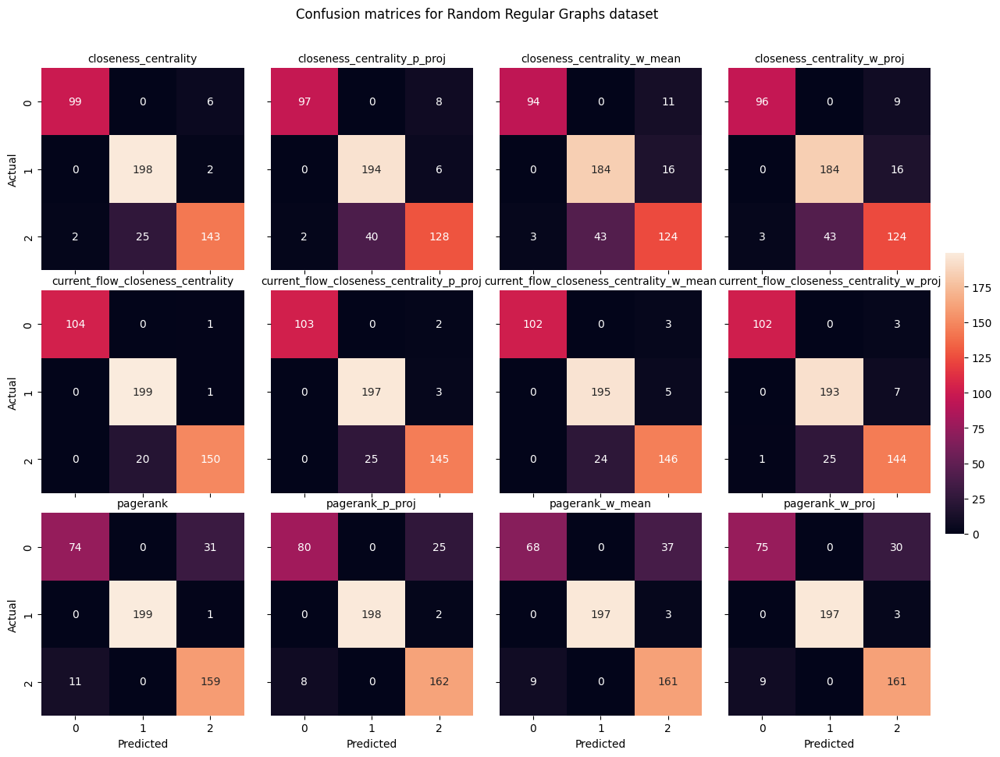

In [17]:
rrg_evaluator_best.plot_confusion_matrices_grid(
    plot_title="Confusion matrices for Random Regular Graphs dataset",
    cols_number_on_plot=4,
)

In [18]:
rrg_evaluator_best.plot_roc_curves(
    width=900,
    height=600,
)

In [19]:
rrg_evaluator_best.plot_precision_recall(width=800, height=600)